In [1]:
# Hyperparameters
N_EPOCH=200
BATCH_SIZE=64
LR=0.0002
B1=0.5
B2=0.999
N_CPU=8
LATENT_DIM=100
IMG_SIZE=32
CHANNELS=3
N_CRITIC=5
CLIP_VALUE=0.01
SAMPLE_INTERVAL=400
DATA_DIR = "/home/giusy/datasets"

In [2]:
import os
import numpy as np
import math
import sys
import torchvision.transforms as transforms
from torchvision.utils import save_image

from torch.utils.data import DataLoader, Subset
from torchvision import datasets
from torchvision.utils import make_grid
from torch.autograd import Variable
from torchvision import datasets
import torch.nn as nn
import torch.nn.functional as F
import torch.autograd as autograd
import torch
from tqdm import tqdm

from matplotlib import pyplot as plt
import sys

os.makedirs(DATA_DIR, exist_ok=True)
os.makedirs(os.path.join(DATA_DIR,"images_wgan_gp_original_cifar"), exist_ok=True)

class Parser:
    n_epochs= N_EPOCH
    batch_size= BATCH_SIZE
    lr= LR
    b1= B1
    b2= B2
    n_cpu= N_CPU
    latent_dim= LATENT_DIM
    img_size= IMG_SIZE
    channels= CHANNELS
    n_critic= N_CRITIC
    clip_value= CLIP_VALUE
    sample_interval= SAMPLE_INTERVAL
    data_dir = DATA_DIR

opt = Parser()

%matplotlib inline

In [3]:
img_shape = (opt.channels, opt.img_size, opt.img_size)

In [4]:
cuda = True if torch.cuda.is_available() else False

In [5]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        def block(in_feat, out_feat, normalize=True):
            layers = [nn.Linear(in_feat, out_feat)]
            if normalize:
                layers.append(nn.BatchNorm1d(out_feat, 0.8))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *block(opt.latent_dim, 128, normalize=False),
            *block(128, 256),
            *block(256, 512),
            *block(512, 1024),
            nn.Linear(1024, int(np.prod(img_shape))),
            nn.Tanh()
        )

    def forward(self, z):
        img = self.model(z)
        img = img.view(img.shape[0], *img_shape)
        return img


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(int(np.prod(img_shape)), 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
        )

    def forward(self, img):
        img_flat = img.view(img.shape[0], -1)
        validity = self.model(img_flat)
        return validity


In [6]:
# Loss weight for gradient penalty
lambda_gp = 10

# Initialize generator and discriminator
generator = Generator()
discriminator = Discriminator()
print(generator)
print(discriminator)

if cuda:
    generator.cuda()
    discriminator.cuda()

# Configure data loader
os.makedirs(opt.data_dir, exist_ok=True)

# Setup transform
transform=transforms.Compose(
            [transforms.Resize(opt.img_size), transforms.ToTensor(), transforms.Normalize([0.5], [0.5])]
        )

dataset = datasets.CIFAR10(root=opt.data_dir, train=True, download=False, transform=transform)

# Get cat indexes
cat_idx = [i for i in range(len(dataset)) if dataset.targets[i] == 3]
print(f"Selected samples: {len(cat_idx)}")

# Create subset
dataset = Subset(dataset, cat_idx)

# Create loader
dataloader = DataLoader(dataset, batch_size=opt.batch_size, shuffle=True, num_workers=opt.n_cpu, drop_last=True)

# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))

Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

Generator(
  (model): Sequential(
    (0): Linear(in_features=100, out_features=128, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Linear(in_features=128, out_features=256, bias=True)
    (3): BatchNorm1d(256, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Linear(in_features=256, out_features=512, bias=True)
    (6): BatchNorm1d(512, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Linear(in_features=512, out_features=1024, bias=True)
    (9): BatchNorm1d(1024, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Linear(in_features=1024, out_features=3072, bias=True)
    (12): Tanh()
  )
)
Discriminator(
  (model): Sequential(
    (0): Linear(in_features=3072, out_features=512, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=Tru

In [7]:
def compute_gradient_penalty(D, real_samples, fake_samples):
    """Calculates the gradient penalty loss for WGAN GP"""
    # Random weight term for interpolation between real and fake samples
    alpha = Tensor(np.random.random((real_samples.size(0), 1, 1, 1)))
    # Get random interpolation between real and fake samples
    interpolates = (alpha * real_samples + ((1 - alpha) * fake_samples)).requires_grad_(True)
    d_interpolates = D(interpolates)
    fake = Variable(Tensor(real_samples.shape[0], 1).fill_(1.0), requires_grad=False)
    # Get gradient w.r.t. interpolates
    gradients = autograd.grad(
        outputs=d_interpolates,
        inputs=interpolates,
        grad_outputs=fake,
        create_graph=True,
        retain_graph=True,
        only_inputs=True,
    )[0]
    gradients = gradients.view(gradients.size(0), -1)
    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
    return gradient_penalty


  0%|          | 0/200 [00:00<?, ?it/s]

Epoch 1: DL=-10.6893, GL=-0.3368


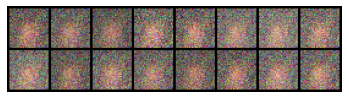

  0%|          | 1/200 [00:03<10:10,  3.07s/it]

Epoch 2: DL=-19.9241, GL=-0.5724


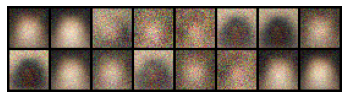

  1%|          | 2/200 [00:05<09:19,  2.83s/it]

Epoch 3: DL=-18.9759, GL=-0.0111


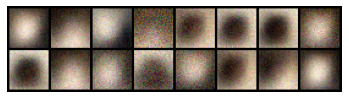

  2%|▏         | 3/200 [00:08<09:24,  2.86s/it]

Epoch 4: DL=-17.3125, GL=0.0566


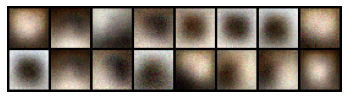

  2%|▏         | 4/200 [00:11<09:16,  2.84s/it]

Epoch 5: DL=-14.5362, GL=0.3602


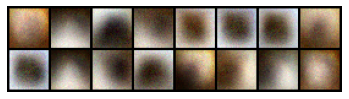

  2%|▎         | 5/200 [00:14<08:57,  2.76s/it]

Epoch 6: DL=-13.0369, GL=0.1068


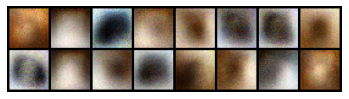

  3%|▎         | 6/200 [00:16<08:53,  2.75s/it]

Epoch 7: DL=-10.9166, GL=0.0605


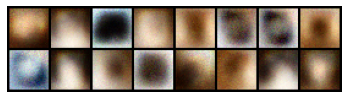

  4%|▎         | 7/200 [00:19<08:49,  2.75s/it]

Epoch 8: DL=-10.6394, GL=0.3250


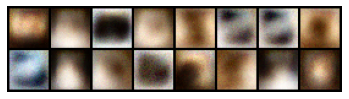

  4%|▍         | 8/200 [00:22<08:48,  2.75s/it]

Epoch 9: DL=-10.5807, GL=0.3601


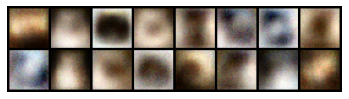

  4%|▍         | 9/200 [00:24<08:37,  2.71s/it]

Epoch 10: DL=-10.3777, GL=0.1154


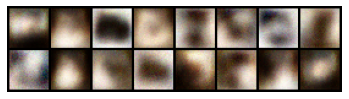

  5%|▌         | 10/200 [00:27<08:32,  2.70s/it]

Epoch 11: DL=-10.1004, GL=0.2655


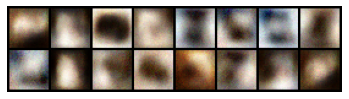

  6%|▌         | 11/200 [00:30<08:45,  2.78s/it]

Epoch 12: DL=-9.9225, GL=0.2808


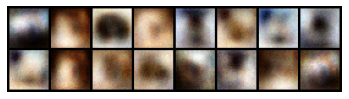

  6%|▌         | 12/200 [00:33<08:36,  2.75s/it]

Epoch 13: DL=-9.7115, GL=0.3011


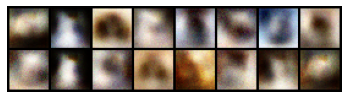

  6%|▋         | 13/200 [00:35<08:33,  2.74s/it]

Epoch 14: DL=-9.7450, GL=0.4681


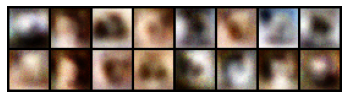

  7%|▋         | 14/200 [00:38<08:30,  2.75s/it]

Epoch 15: DL=-9.6879, GL=0.3360


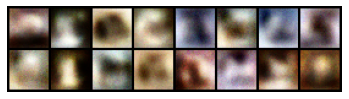

  8%|▊         | 15/200 [00:41<08:30,  2.76s/it]

Epoch 16: DL=-9.5783, GL=0.4969


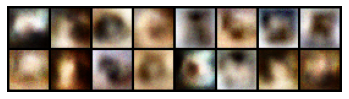

  8%|▊         | 16/200 [00:44<08:34,  2.80s/it]

Epoch 17: DL=-9.3901, GL=0.3861


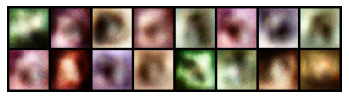

  8%|▊         | 17/200 [00:47<08:36,  2.82s/it]

Epoch 18: DL=-9.2169, GL=0.5037


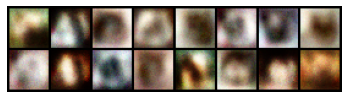

  9%|▉         | 18/200 [00:49<08:26,  2.78s/it]

Epoch 19: DL=-8.4950, GL=0.7065


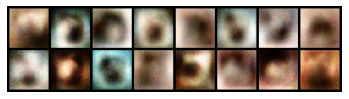

 10%|▉         | 19/200 [00:52<08:26,  2.80s/it]

Epoch 20: DL=-8.8087, GL=0.3211


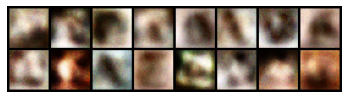

 10%|█         | 20/200 [00:55<08:23,  2.80s/it]

Epoch 21: DL=-8.5421, GL=0.4136


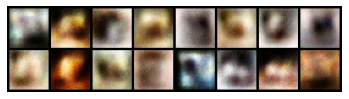

 10%|█         | 21/200 [00:58<08:22,  2.81s/it]

Epoch 22: DL=-8.2584, GL=0.4171


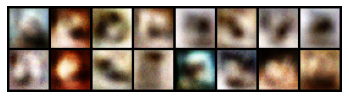

 11%|█         | 22/200 [01:01<08:20,  2.81s/it]

Epoch 23: DL=-8.4470, GL=0.3903


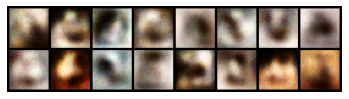

 12%|█▏        | 23/200 [01:04<08:18,  2.82s/it]

Epoch 24: DL=-8.4210, GL=0.4326


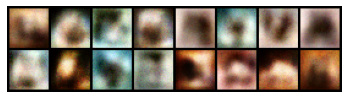

 12%|█▏        | 24/200 [01:06<07:57,  2.71s/it]

Epoch 25: DL=-8.0400, GL=0.6421


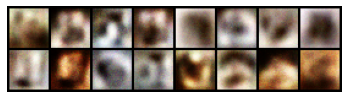

 12%|█▎        | 25/200 [01:09<07:44,  2.66s/it]

Epoch 26: DL=-8.2131, GL=0.3620


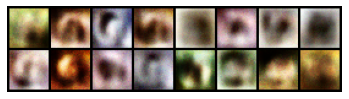

 13%|█▎        | 26/200 [01:11<07:56,  2.74s/it]

Epoch 27: DL=-7.9675, GL=0.7101


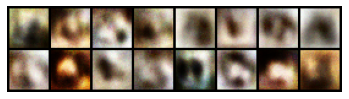

 14%|█▎        | 27/200 [01:14<07:50,  2.72s/it]

Epoch 28: DL=-7.5385, GL=0.5167


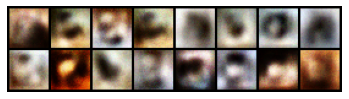

 14%|█▍        | 28/200 [01:17<07:45,  2.70s/it]

Epoch 29: DL=-7.5586, GL=0.4849


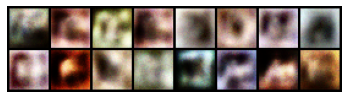

 14%|█▍        | 29/200 [01:19<07:37,  2.67s/it]

Epoch 30: DL=-7.9140, GL=0.5696


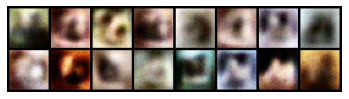

 15%|█▌        | 30/200 [01:22<07:26,  2.63s/it]

Epoch 31: DL=-8.0576, GL=0.5423


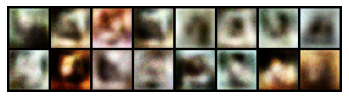

 16%|█▌        | 31/200 [01:25<07:29,  2.66s/it]

Epoch 32: DL=-7.7768, GL=0.5204


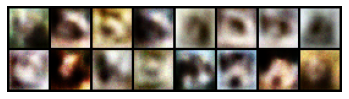

 16%|█▌        | 32/200 [01:28<07:37,  2.73s/it]

Epoch 33: DL=-7.6407, GL=0.7230


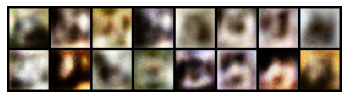

 16%|█▋        | 33/200 [01:30<07:32,  2.71s/it]

Epoch 34: DL=-7.6418, GL=0.6286


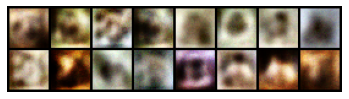

 17%|█▋        | 34/200 [01:33<07:29,  2.71s/it]

Epoch 35: DL=-7.9417, GL=0.7418


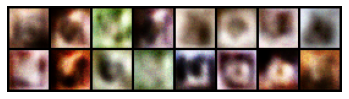

 18%|█▊        | 35/200 [01:36<07:19,  2.66s/it]

Epoch 36: DL=-7.7880, GL=0.7834


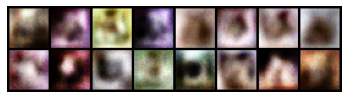

 18%|█▊        | 36/200 [01:38<07:26,  2.72s/it]

Epoch 37: DL=-7.4904, GL=0.7098


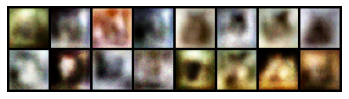

 18%|█▊        | 37/200 [01:41<07:13,  2.66s/it]

Epoch 38: DL=-7.5738, GL=0.8620


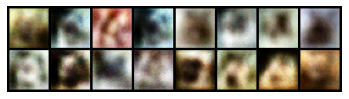

 19%|█▉        | 38/200 [01:44<07:14,  2.68s/it]

Epoch 39: DL=-7.6416, GL=0.6101


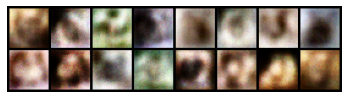

 20%|█▉        | 39/200 [01:46<07:18,  2.72s/it]

Epoch 40: DL=-7.8097, GL=0.8945


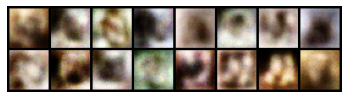

 20%|██        | 40/200 [01:49<07:14,  2.71s/it]

Epoch 41: DL=-7.6945, GL=0.8490


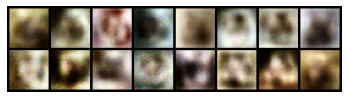

 20%|██        | 41/200 [01:52<07:09,  2.70s/it]

Epoch 42: DL=-7.5809, GL=0.8924


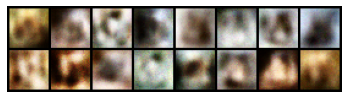

 21%|██        | 42/200 [01:55<07:30,  2.85s/it]

Epoch 43: DL=-7.2451, GL=0.7588


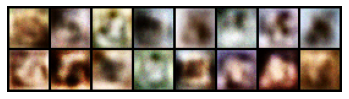

 22%|██▏       | 43/200 [01:58<07:26,  2.84s/it]

Epoch 44: DL=-7.3388, GL=0.6798


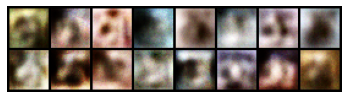

 22%|██▏       | 44/200 [02:01<07:29,  2.88s/it]

Epoch 45: DL=-7.1881, GL=0.8152


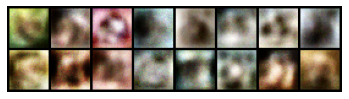

 22%|██▎       | 45/200 [02:04<07:44,  3.00s/it]

Epoch 46: DL=-6.9602, GL=0.5801


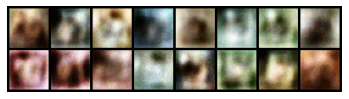

 23%|██▎       | 46/200 [02:07<07:51,  3.06s/it]

Epoch 47: DL=-6.7601, GL=0.8774


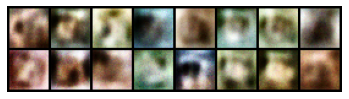

 24%|██▎       | 47/200 [02:10<07:37,  2.99s/it]

Epoch 48: DL=-6.1752, GL=0.5876


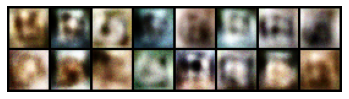

 24%|██▍       | 48/200 [02:13<07:26,  2.94s/it]

Epoch 49: DL=-6.2591, GL=0.6972


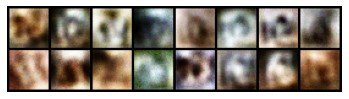

 24%|██▍       | 49/200 [02:16<07:10,  2.85s/it]

Epoch 50: DL=-6.3144, GL=0.6298


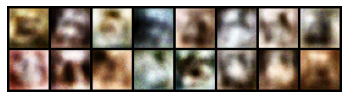

 25%|██▌       | 50/200 [02:18<07:08,  2.86s/it]

Epoch 51: DL=-6.0454, GL=0.6162


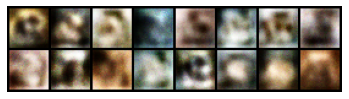

 26%|██▌       | 51/200 [02:21<07:15,  2.92s/it]

Epoch 52: DL=-5.9824, GL=0.7472


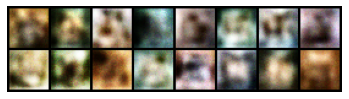

 26%|██▌       | 52/200 [02:24<07:08,  2.90s/it]

Epoch 53: DL=-5.9708, GL=0.7809


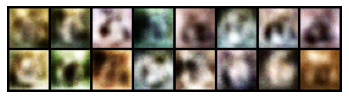

 26%|██▋       | 53/200 [02:27<07:03,  2.88s/it]

Epoch 54: DL=-5.7814, GL=0.6284


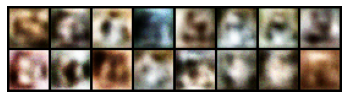

 27%|██▋       | 54/200 [02:30<07:01,  2.89s/it]

Epoch 55: DL=-5.7169, GL=0.5754


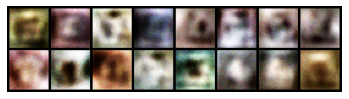

 28%|██▊       | 55/200 [02:33<06:58,  2.88s/it]

Epoch 56: DL=-5.5488, GL=0.4430


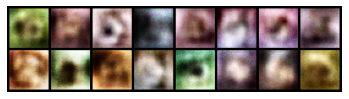

 28%|██▊       | 56/200 [02:36<06:59,  2.92s/it]

Epoch 57: DL=-5.2425, GL=0.5198


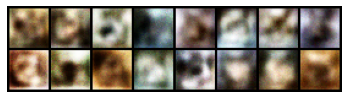

 28%|██▊       | 57/200 [02:39<07:00,  2.94s/it]

Epoch 58: DL=-5.3843, GL=0.6075


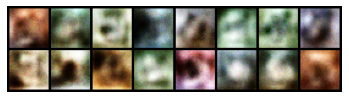

 29%|██▉       | 58/200 [02:42<06:57,  2.94s/it]

Epoch 59: DL=-5.2424, GL=0.5286


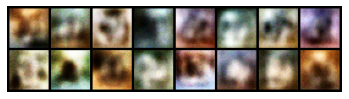

 30%|██▉       | 59/200 [02:45<06:50,  2.91s/it]

Epoch 60: DL=-5.1577, GL=0.4400


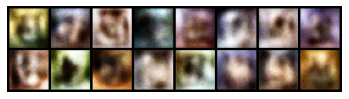

 30%|███       | 60/200 [02:48<06:53,  2.95s/it]

Epoch 61: DL=-5.2643, GL=0.4702


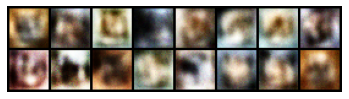

 30%|███       | 61/200 [02:51<06:51,  2.96s/it]

Epoch 62: DL=-5.2053, GL=0.5100


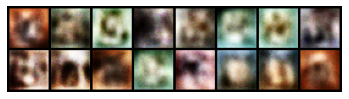

 31%|███       | 62/200 [02:54<06:46,  2.95s/it]

Epoch 63: DL=-5.2202, GL=0.2750


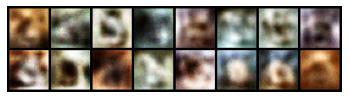

 32%|███▏      | 63/200 [02:57<06:47,  2.98s/it]

Epoch 64: DL=-5.0124, GL=0.6336


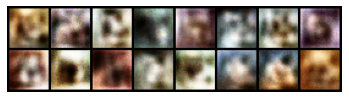

 32%|███▏      | 64/200 [03:00<06:39,  2.94s/it]

Epoch 65: DL=-4.9371, GL=0.5157


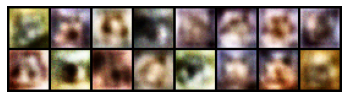

 32%|███▎      | 65/200 [03:02<06:18,  2.81s/it]

Epoch 66: DL=-4.8235, GL=0.4656


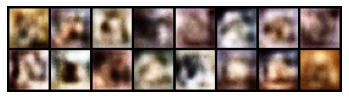

 33%|███▎      | 66/200 [03:05<06:12,  2.78s/it]

Epoch 67: DL=-4.9793, GL=0.6062


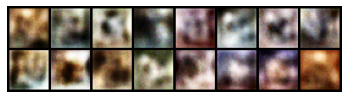

 34%|███▎      | 67/200 [03:08<06:12,  2.80s/it]

Epoch 68: DL=-4.8325, GL=0.4312


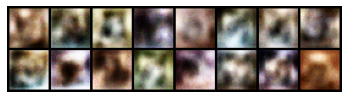

 34%|███▍      | 68/200 [03:10<06:11,  2.81s/it]

Epoch 69: DL=-4.9626, GL=0.6238


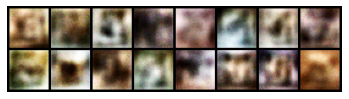

 34%|███▍      | 69/200 [03:13<05:55,  2.72s/it]

Epoch 70: DL=-4.7611, GL=0.5242


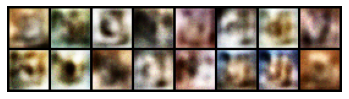

 35%|███▌      | 70/200 [03:16<05:49,  2.69s/it]

Epoch 71: DL=-4.9740, GL=0.4160


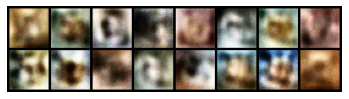

 36%|███▌      | 71/200 [03:19<05:56,  2.77s/it]

Epoch 72: DL=-4.9304, GL=0.5821


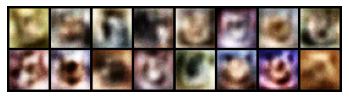

 36%|███▌      | 72/200 [03:21<05:55,  2.78s/it]

Epoch 73: DL=-4.7001, GL=0.3960


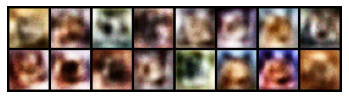

 36%|███▋      | 73/200 [03:24<05:57,  2.81s/it]

Epoch 74: DL=-5.0168, GL=0.7417


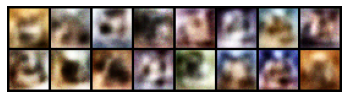

 37%|███▋      | 74/200 [03:27<05:57,  2.83s/it]

Epoch 75: DL=-4.8633, GL=0.2629


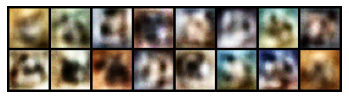

 38%|███▊      | 75/200 [03:30<05:51,  2.81s/it]

Epoch 76: DL=-4.8498, GL=0.3573


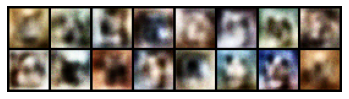

 38%|███▊      | 76/200 [03:33<05:54,  2.86s/it]

Epoch 77: DL=-4.8071, GL=0.4773


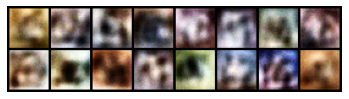

 38%|███▊      | 77/200 [03:36<05:44,  2.80s/it]

Epoch 78: DL=-4.9134, GL=0.4296


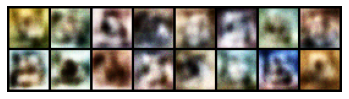

 39%|███▉      | 78/200 [03:38<05:39,  2.79s/it]

Epoch 79: DL=-4.8072, GL=0.4241


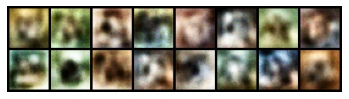

 40%|███▉      | 79/200 [03:41<05:34,  2.76s/it]

Epoch 80: DL=-4.6286, GL=0.4374


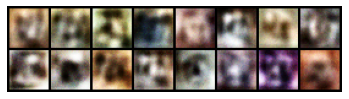

 40%|████      | 80/200 [03:44<05:25,  2.71s/it]

Epoch 81: DL=-4.6383, GL=0.2440


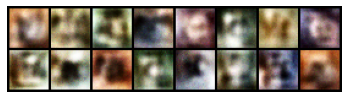

 40%|████      | 81/200 [03:46<05:27,  2.75s/it]

Epoch 82: DL=-4.6717, GL=0.4122


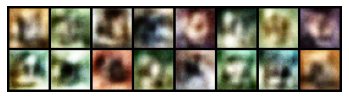

 41%|████      | 82/200 [03:49<05:25,  2.76s/it]

Epoch 83: DL=-4.6112, GL=0.3482


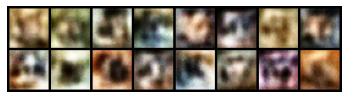

 42%|████▏     | 83/200 [03:52<05:20,  2.74s/it]

Epoch 84: DL=-4.6507, GL=0.3864


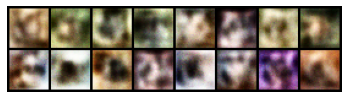

 42%|████▏     | 84/200 [03:55<05:23,  2.79s/it]

Epoch 85: DL=-4.4385, GL=0.5016


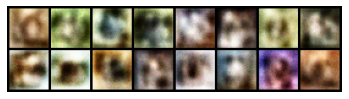

 42%|████▎     | 85/200 [03:57<05:15,  2.74s/it]

Epoch 86: DL=-4.3038, GL=0.4724


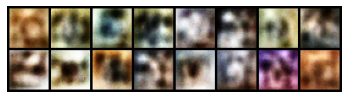

 43%|████▎     | 86/200 [04:00<05:08,  2.71s/it]

Epoch 87: DL=-4.3736, GL=0.4185


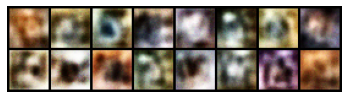

 44%|████▎     | 87/200 [04:03<05:11,  2.75s/it]

Epoch 88: DL=-4.4011, GL=0.3728


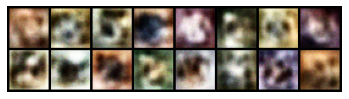

 44%|████▍     | 88/200 [04:06<05:04,  2.72s/it]

Epoch 89: DL=-4.6052, GL=0.5569


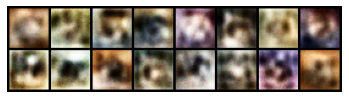

 44%|████▍     | 89/200 [04:08<05:08,  2.78s/it]

Epoch 90: DL=-4.2553, GL=0.2112


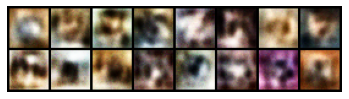

 45%|████▌     | 90/200 [04:11<05:02,  2.75s/it]

Epoch 91: DL=-4.3168, GL=0.4228


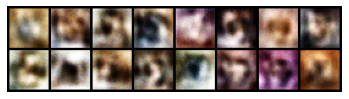

 46%|████▌     | 91/200 [04:14<05:00,  2.75s/it]

Epoch 92: DL=-4.3373, GL=0.4350


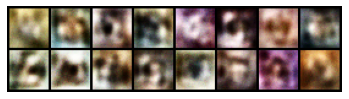

 46%|████▌     | 92/200 [04:17<04:52,  2.71s/it]

Epoch 93: DL=-4.2511, GL=0.4860


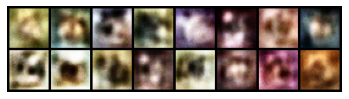

 46%|████▋     | 93/200 [04:19<04:48,  2.69s/it]

Epoch 94: DL=-4.3862, GL=0.4724


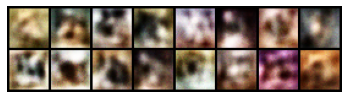

 47%|████▋     | 94/200 [04:22<04:52,  2.76s/it]

Epoch 95: DL=-4.3186, GL=0.5906


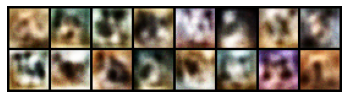

 48%|████▊     | 95/200 [04:25<04:51,  2.77s/it]

Epoch 96: DL=-4.4506, GL=0.3220


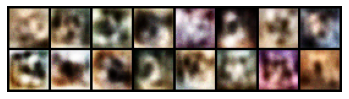

 48%|████▊     | 96/200 [04:28<04:49,  2.78s/it]

Epoch 97: DL=-4.5244, GL=0.5230


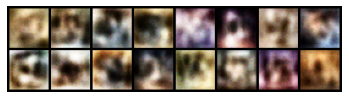

 48%|████▊     | 97/200 [04:30<04:43,  2.76s/it]

Epoch 98: DL=-4.3934, GL=0.3699


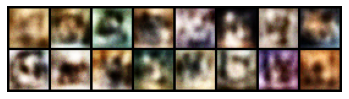

 49%|████▉     | 98/200 [04:33<04:42,  2.77s/it]

Epoch 99: DL=-4.1347, GL=0.2935


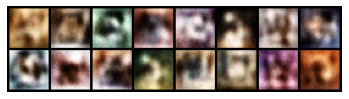

 50%|████▉     | 99/200 [04:36<04:34,  2.72s/it]

Epoch 100: DL=-4.1032, GL=0.3506


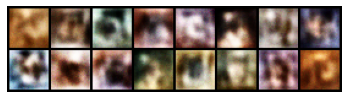

 50%|█████     | 100/200 [04:39<04:33,  2.73s/it]

Epoch 101: DL=-4.0659, GL=0.5160


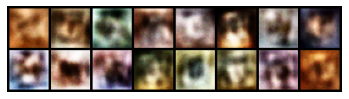

 50%|█████     | 101/200 [04:41<04:34,  2.78s/it]

Epoch 102: DL=-4.2597, GL=0.3131


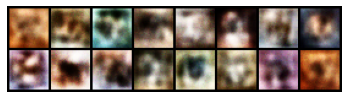

 51%|█████     | 102/200 [04:44<04:32,  2.78s/it]

Epoch 103: DL=-4.3540, GL=0.4937


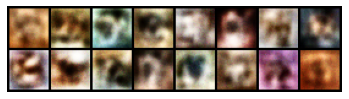

 52%|█████▏    | 103/200 [04:47<04:30,  2.78s/it]

Epoch 104: DL=-4.3742, GL=0.4435


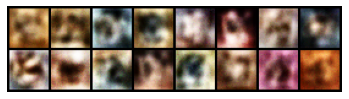

 52%|█████▏    | 104/200 [04:50<04:23,  2.74s/it]

Epoch 105: DL=-4.3480, GL=0.3792


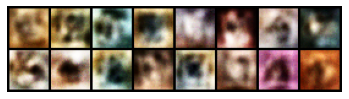

 52%|█████▎    | 105/200 [04:52<04:19,  2.73s/it]

Epoch 106: DL=-4.3943, GL=0.5329


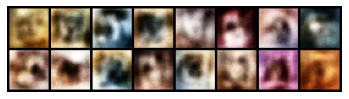

 53%|█████▎    | 106/200 [04:55<04:14,  2.71s/it]

Epoch 107: DL=-4.5876, GL=0.6720


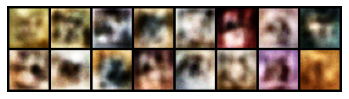

 54%|█████▎    | 107/200 [04:58<04:12,  2.71s/it]

Epoch 108: DL=-4.3889, GL=0.3891


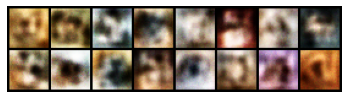

 54%|█████▍    | 108/200 [05:00<04:06,  2.68s/it]

Epoch 109: DL=-4.5004, GL=0.5313


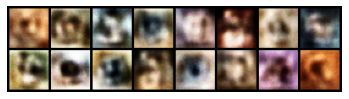

 55%|█████▍    | 109/200 [05:03<04:03,  2.67s/it]

Epoch 110: DL=-4.5479, GL=0.3628


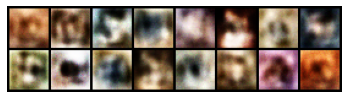

 55%|█████▌    | 110/200 [05:06<04:02,  2.69s/it]

Epoch 111: DL=-4.2780, GL=0.5830


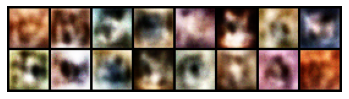

 56%|█████▌    | 111/200 [05:09<04:02,  2.73s/it]

Epoch 112: DL=-4.3876, GL=0.3465


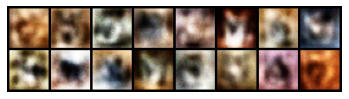

 56%|█████▌    | 112/200 [05:11<03:56,  2.69s/it]

Epoch 113: DL=-4.5798, GL=0.4886


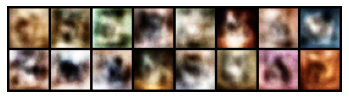

 56%|█████▋    | 113/200 [05:14<03:53,  2.69s/it]

Epoch 114: DL=-4.4563, GL=0.5006


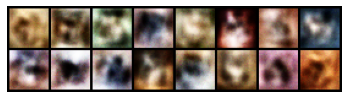

 57%|█████▋    | 114/200 [05:17<03:50,  2.68s/it]

Epoch 115: DL=-4.4272, GL=0.3516


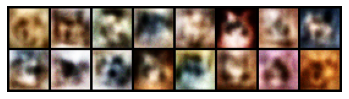

 57%|█████▊    | 115/200 [05:19<03:51,  2.72s/it]

Epoch 116: DL=-4.3505, GL=0.2683


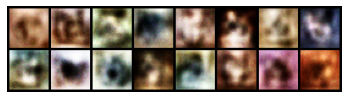

 58%|█████▊    | 116/200 [05:22<03:50,  2.74s/it]

Epoch 117: DL=-4.3448, GL=0.5797


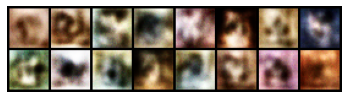

 58%|█████▊    | 117/200 [05:25<03:49,  2.77s/it]

Epoch 118: DL=-4.3783, GL=0.4842


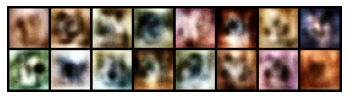

 59%|█████▉    | 118/200 [05:28<03:43,  2.72s/it]

Epoch 119: DL=-4.4749, GL=0.3815


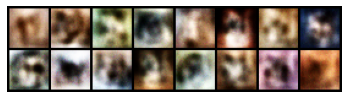

 60%|█████▉    | 119/200 [05:30<03:36,  2.67s/it]

Epoch 120: DL=-4.3255, GL=0.7240


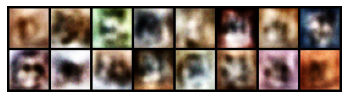

 60%|██████    | 120/200 [05:33<03:36,  2.71s/it]

Epoch 121: DL=-4.2141, GL=0.5035


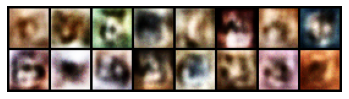

 60%|██████    | 121/200 [05:36<03:36,  2.74s/it]

Epoch 122: DL=-4.4577, GL=0.3629


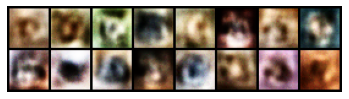

 61%|██████    | 122/200 [05:39<03:36,  2.78s/it]

Epoch 123: DL=-4.4637, GL=0.6410


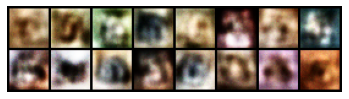

 62%|██████▏   | 123/200 [05:41<03:36,  2.82s/it]

Epoch 124: DL=-4.4469, GL=0.4988


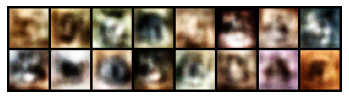

 62%|██████▏   | 124/200 [05:44<03:32,  2.79s/it]

Epoch 125: DL=-4.2111, GL=0.3689


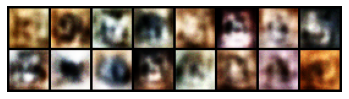

 62%|██████▎   | 125/200 [05:47<03:25,  2.74s/it]

Epoch 126: DL=-4.4998, GL=0.6660


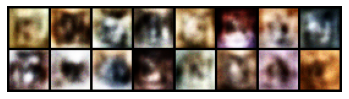

 63%|██████▎   | 126/200 [05:50<03:24,  2.76s/it]

Epoch 127: DL=-4.4468, GL=0.5556


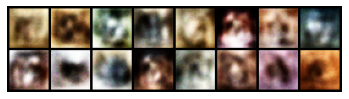

 64%|██████▎   | 127/200 [05:52<03:23,  2.79s/it]

Epoch 128: DL=-4.3804, GL=0.5570


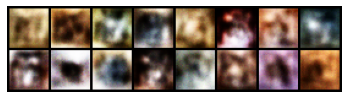

 64%|██████▍   | 128/200 [05:55<03:17,  2.74s/it]

Epoch 129: DL=-4.2747, GL=0.4015


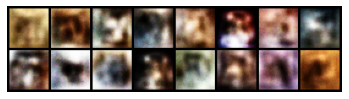

 64%|██████▍   | 129/200 [05:58<03:09,  2.68s/it]

Epoch 130: DL=-4.2369, GL=0.6244


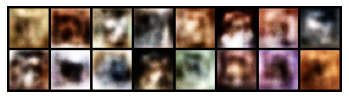

 65%|██████▌   | 130/200 [06:00<03:08,  2.69s/it]

Epoch 131: DL=-4.2740, GL=0.5788


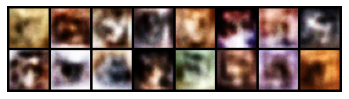

 66%|██████▌   | 131/200 [06:03<03:07,  2.72s/it]

Epoch 132: DL=-4.3416, GL=0.6038


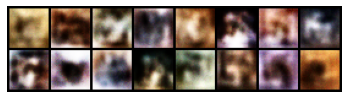

 66%|██████▌   | 132/200 [06:06<03:08,  2.77s/it]

Epoch 133: DL=-4.2160, GL=0.4707


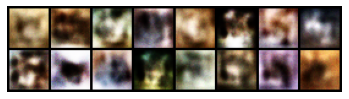

 66%|██████▋   | 133/200 [06:09<03:00,  2.70s/it]

Epoch 134: DL=-4.4371, GL=0.6236


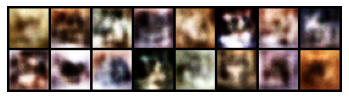

 67%|██████▋   | 134/200 [06:11<03:00,  2.74s/it]

Epoch 135: DL=-4.3068, GL=0.7621


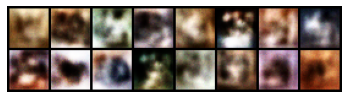

 68%|██████▊   | 135/200 [06:14<03:02,  2.80s/it]

Epoch 136: DL=-4.2466, GL=0.5673


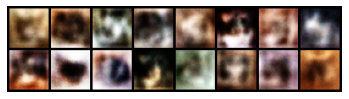

 68%|██████▊   | 136/200 [06:17<03:01,  2.84s/it]

Epoch 137: DL=-4.3321, GL=0.7006


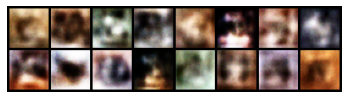

 68%|██████▊   | 137/200 [06:20<02:57,  2.82s/it]

Epoch 138: DL=-4.2760, GL=0.5746


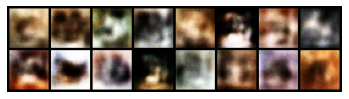

 69%|██████▉   | 138/200 [06:23<02:54,  2.81s/it]

Epoch 139: DL=-4.3536, GL=0.6597


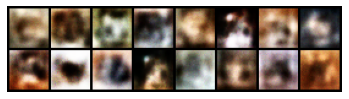

 70%|██████▉   | 139/200 [06:26<02:49,  2.78s/it]

Epoch 140: DL=-4.3584, GL=0.7544


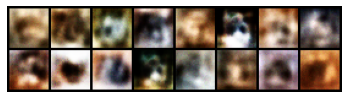

 70%|███████   | 140/200 [06:28<02:46,  2.78s/it]

Epoch 141: DL=-4.5509, GL=0.7699


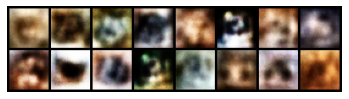

 70%|███████   | 141/200 [06:31<02:44,  2.79s/it]

Epoch 142: DL=-4.2998, GL=0.7600


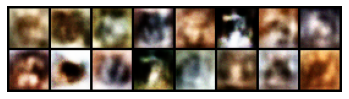

 71%|███████   | 142/200 [06:34<02:40,  2.76s/it]

Epoch 143: DL=-4.6383, GL=0.9274


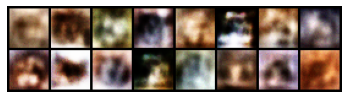

 72%|███████▏  | 143/200 [06:36<02:34,  2.71s/it]

Epoch 144: DL=-4.5347, GL=0.8433


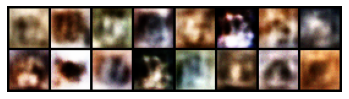

 72%|███████▏  | 144/200 [06:39<02:34,  2.76s/it]

Epoch 145: DL=-4.6074, GL=0.8697


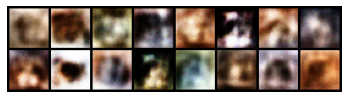

 72%|███████▎  | 145/200 [06:42<02:32,  2.78s/it]

Epoch 146: DL=-4.5491, GL=0.9569


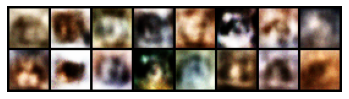

 73%|███████▎  | 146/200 [06:45<02:29,  2.77s/it]

Epoch 147: DL=-4.5221, GL=0.8855


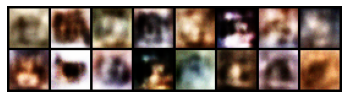

 74%|███████▎  | 147/200 [06:48<02:26,  2.77s/it]

Epoch 148: DL=-4.5106, GL=1.2188


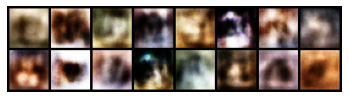

 74%|███████▍  | 148/200 [06:50<02:21,  2.72s/it]

Epoch 149: DL=-4.5436, GL=1.0131


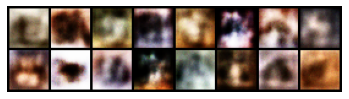

 74%|███████▍  | 149/200 [06:53<02:18,  2.71s/it]

Epoch 150: DL=-4.7241, GL=1.1162


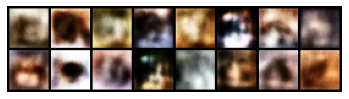

 75%|███████▌  | 150/200 [06:56<02:17,  2.76s/it]

Epoch 151: DL=-4.6645, GL=1.1833


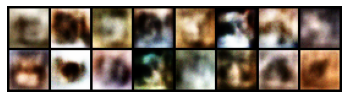

 76%|███████▌  | 151/200 [06:58<02:11,  2.68s/it]

Epoch 152: DL=-4.8857, GL=1.4000


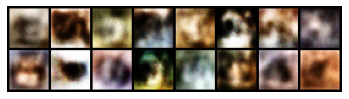

 76%|███████▌  | 152/200 [07:01<02:10,  2.71s/it]

Epoch 153: DL=-4.9178, GL=1.1664


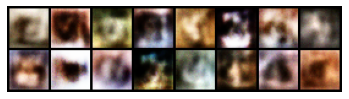

 76%|███████▋  | 153/200 [07:04<02:04,  2.66s/it]

Epoch 154: DL=-5.1044, GL=1.3253


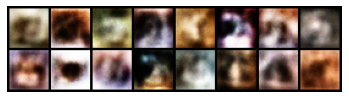

 77%|███████▋  | 154/200 [07:06<01:58,  2.57s/it]

Epoch 155: DL=-5.1280, GL=1.3232


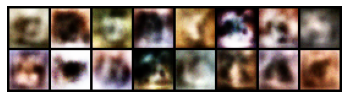

 78%|███████▊  | 155/200 [07:08<01:52,  2.49s/it]

Epoch 156: DL=-5.1144, GL=1.4910


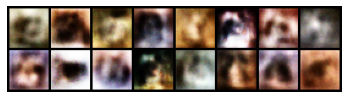

 78%|███████▊  | 156/200 [07:11<01:54,  2.61s/it]

Epoch 157: DL=-5.0855, GL=1.2979


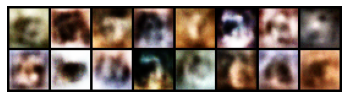

 78%|███████▊  | 157/200 [07:14<01:57,  2.72s/it]

Epoch 158: DL=-5.1076, GL=1.4646


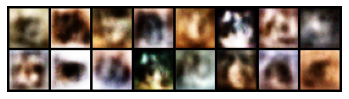

 79%|███████▉  | 158/200 [07:17<01:51,  2.66s/it]

Epoch 159: DL=-5.1516, GL=1.4607


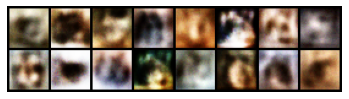

 80%|███████▉  | 159/200 [07:19<01:49,  2.68s/it]

Epoch 160: DL=-5.1185, GL=1.3446


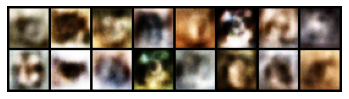

 80%|████████  | 160/200 [07:22<01:46,  2.66s/it]

Epoch 161: DL=-5.1087, GL=1.5108


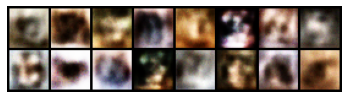

 80%|████████  | 161/200 [07:25<01:44,  2.68s/it]

Epoch 162: DL=-5.1884, GL=1.4016


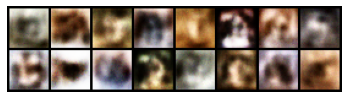

 81%|████████  | 162/200 [07:27<01:41,  2.68s/it]

Epoch 163: DL=-5.2027, GL=1.3851


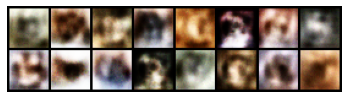

 82%|████████▏ | 163/200 [07:30<01:39,  2.69s/it]

Epoch 164: DL=-5.2423, GL=1.3722


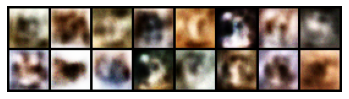

 82%|████████▏ | 164/200 [07:33<01:37,  2.70s/it]

Epoch 165: DL=-5.3780, GL=1.4152


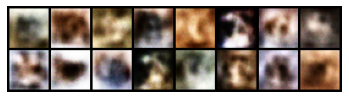

 82%|████████▎ | 165/200 [07:36<01:34,  2.69s/it]

Epoch 166: DL=-5.2897, GL=1.5405


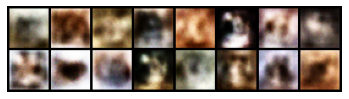

 83%|████████▎ | 166/200 [07:38<01:33,  2.74s/it]

Epoch 167: DL=-5.3606, GL=1.3161


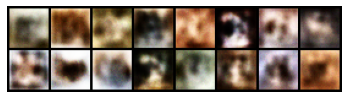

 84%|████████▎ | 167/200 [07:41<01:30,  2.73s/it]

Epoch 168: DL=-5.2807, GL=1.5105


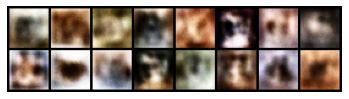

 84%|████████▍ | 168/200 [07:44<01:26,  2.71s/it]

Epoch 169: DL=-5.2113, GL=1.5503


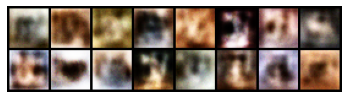

 84%|████████▍ | 169/200 [07:47<01:24,  2.73s/it]

Epoch 170: DL=-5.1771, GL=1.4250


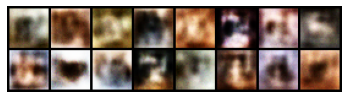

 85%|████████▌ | 170/200 [07:49<01:22,  2.75s/it]

Epoch 171: DL=-5.2099, GL=1.3934


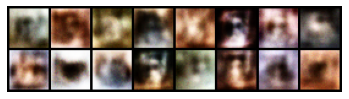

 86%|████████▌ | 171/200 [07:52<01:21,  2.80s/it]

Epoch 172: DL=-5.1488, GL=1.4017


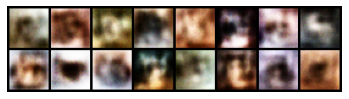

 86%|████████▌ | 172/200 [07:55<01:18,  2.80s/it]

Epoch 173: DL=-5.1992, GL=1.6186


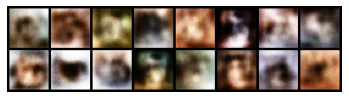

 86%|████████▋ | 173/200 [07:58<01:15,  2.80s/it]

Epoch 174: DL=-5.0315, GL=1.4298


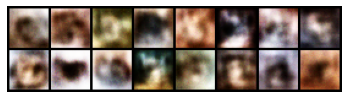

 87%|████████▋ | 174/200 [08:01<01:13,  2.81s/it]

Epoch 175: DL=-5.0517, GL=1.4866


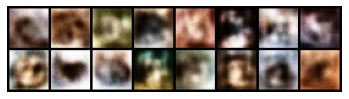

 88%|████████▊ | 175/200 [08:03<01:09,  2.78s/it]

Epoch 176: DL=-4.9719, GL=1.2613


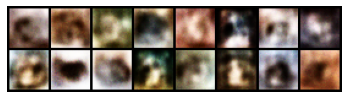

 88%|████████▊ | 176/200 [08:06<01:06,  2.77s/it]

Epoch 177: DL=-4.9460, GL=1.4125


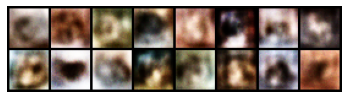

 88%|████████▊ | 177/200 [08:09<01:04,  2.79s/it]

Epoch 178: DL=-4.9276, GL=1.3534


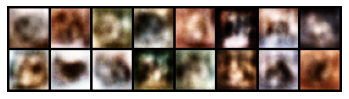

 89%|████████▉ | 178/200 [08:12<01:00,  2.77s/it]

Epoch 179: DL=-4.8772, GL=1.3201


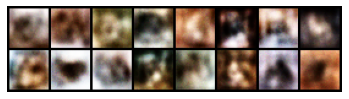

 90%|████████▉ | 179/200 [08:14<00:57,  2.76s/it]

Epoch 180: DL=-4.8162, GL=1.3858


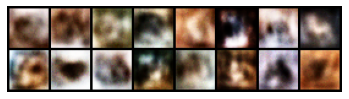

 90%|█████████ | 180/200 [08:17<00:55,  2.77s/it]

Epoch 181: DL=-5.0412, GL=1.3677


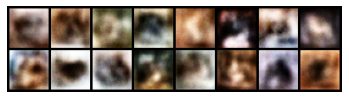

 90%|█████████ | 181/200 [08:20<00:53,  2.79s/it]

Epoch 182: DL=-4.9099, GL=1.3936


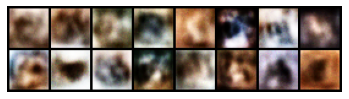

 91%|█████████ | 182/200 [08:23<00:50,  2.78s/it]

Epoch 183: DL=-4.9866, GL=1.2180


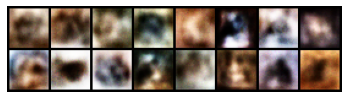

 92%|█████████▏| 183/200 [08:26<00:48,  2.84s/it]

Epoch 184: DL=-5.0009, GL=1.3919


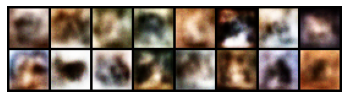

 92%|█████████▏| 184/200 [08:28<00:43,  2.73s/it]

Epoch 185: DL=-4.8834, GL=1.2608


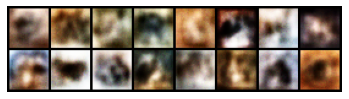

 92%|█████████▎| 185/200 [08:30<00:38,  2.58s/it]

Epoch 186: DL=-4.8074, GL=1.4231


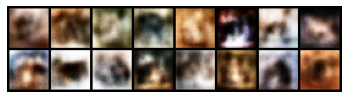

 93%|█████████▎| 186/200 [08:33<00:36,  2.60s/it]

Epoch 187: DL=-4.8939, GL=1.4395


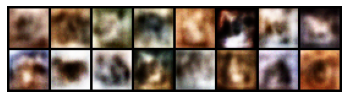

 94%|█████████▎| 187/200 [08:36<00:34,  2.62s/it]

Epoch 188: DL=-4.9353, GL=1.2279


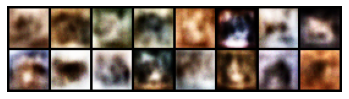

 94%|█████████▍| 188/200 [08:39<00:31,  2.65s/it]

Epoch 189: DL=-4.9293, GL=1.3833


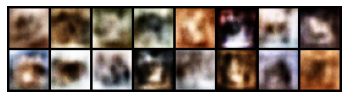

 94%|█████████▍| 189/200 [08:41<00:29,  2.67s/it]

Epoch 190: DL=-4.8518, GL=1.1845


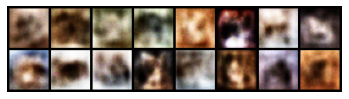

 95%|█████████▌| 190/200 [08:44<00:27,  2.71s/it]

Epoch 191: DL=-4.9074, GL=1.3144


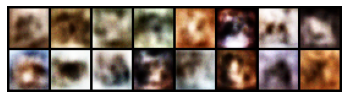

 96%|█████████▌| 191/200 [08:47<00:24,  2.75s/it]

Epoch 192: DL=-4.7034, GL=1.3322


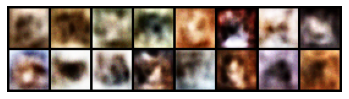

 96%|█████████▌| 192/200 [08:50<00:21,  2.72s/it]

Epoch 193: DL=-4.8541, GL=1.6199


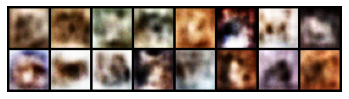

 96%|█████████▋| 193/200 [08:52<00:19,  2.72s/it]

Epoch 194: DL=-4.8598, GL=1.1734


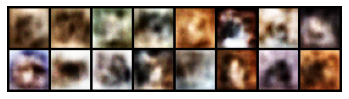

 97%|█████████▋| 194/200 [08:55<00:16,  2.74s/it]

Epoch 195: DL=-4.9351, GL=1.4982


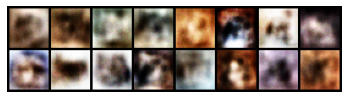

 98%|█████████▊| 195/200 [08:58<00:13,  2.78s/it]

Epoch 196: DL=-4.9054, GL=1.3405


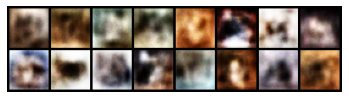

 98%|█████████▊| 196/200 [09:01<00:11,  2.82s/it]

Epoch 197: DL=-4.9904, GL=1.3146


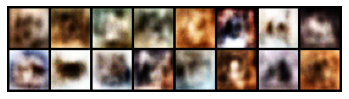

 98%|█████████▊| 197/200 [09:03<00:08,  2.75s/it]

Epoch 198: DL=-5.0327, GL=1.4458


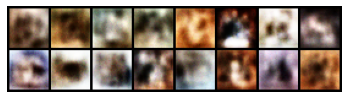

 99%|█████████▉| 198/200 [09:06<00:05,  2.72s/it]

Epoch 199: DL=-5.0483, GL=1.3968


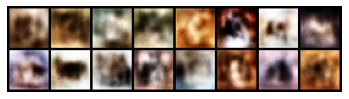

100%|█████████▉| 199/200 [09:09<00:02,  2.76s/it]

Epoch 200: DL=-5.1103, GL=1.5845


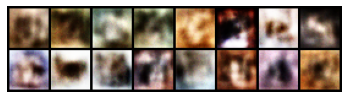

100%|██████████| 200/200 [09:12<00:00,  2.76s/it]


In [8]:
# ----------
#  Training
# ----------
fixed_noise = Tensor(np.random.normal(0, 1, (32, opt.latent_dim)))
batches_done = 0

# Loss history
hist_d_loss = []
hist_g_loss = []

for epoch in tqdm(range(opt.n_epochs)):
    # Losses 
    sum_d_loss = 0
    sum_g_loss = 0
    
    discriminator.train()
    generator.train()
    
    for i, (imgs, _) in enumerate(dataloader):
        
        # Configure input
        real_imgs = Variable(imgs.type(Tensor))
        
        # ---------------------
        #  Train Discriminator
        # ---------------------

        optimizer_D.zero_grad()

        # Sample noise as generator input
        z = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], opt.latent_dim))))

        # Generate a batch of images
        fake_imgs = generator(z)
        
        # Real images
        real_validity = discriminator(real_imgs)
        
        # Fake images
        fake_validity = discriminator(fake_imgs)
        # Gradient penalty
        gradient_penalty = compute_gradient_penalty(discriminator, real_imgs.data, fake_imgs.data)
        # Adversarial loss
        d_loss = -torch.mean(real_validity) + torch.mean(fake_validity) + lambda_gp * gradient_penalty

        sum_d_loss += float(d_loss)
        
        d_loss.backward()
        optimizer_D.step()

        optimizer_G.zero_grad()

        # Train the generator every n_critic steps
        if i % opt.n_critic == 0:

            # -----------------
            #  Train Generator
            # -----------------

            # Generate a batch of images
            fake_imgs = generator(z)
            # Loss measures generator's ability to fool the discriminator
            # Train on fake images
            fake_validity = discriminator(fake_imgs)
            g_loss = -torch.mean(fake_validity)
            
            sum_g_loss += float(g_loss)

            g_loss.backward()
            optimizer_G.step()            
            
            if batches_done % opt.sample_interval == 0:
                save_image(fake_imgs.data[:25], os.path.join(opt.data_dir, "images_wgan_gp_original_cifar/%d.png" % batches_done), nrow=5, normalize=True)

            batches_done += opt.n_critic
      
    epoch_d_loss = sum_d_loss/len(dataloader)
    epoch_g_loss = sum_g_loss/len(dataloader)
    hist_d_loss.append(epoch_d_loss)
    hist_g_loss.append(epoch_g_loss)
    print(f"Epoch {epoch+1}: DL={epoch_d_loss:.4f}, GL={epoch_g_loss:.4f}")
    
    generator.eval()
        
    with torch.no_grad():
        g_output = generator(fixed_noise)[:16,:,:]
        plt.imshow(transforms.ToPILImage()(make_grid(g_output, scale_each=True, normalize=True).cpu()))
        plt.axis('off')
        plt.show()

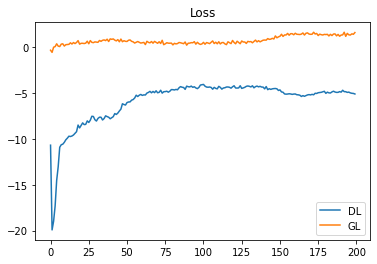

In [9]:
# Plot loss
plt.title("Loss")
plt.plot(hist_d_loss, label="DL")
plt.plot(hist_g_loss, label="GL")
plt.legend()
plt.show()